# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

<h3 style="color:Brown">Business Understanding</h3> 
From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

---

<h4 style="color:Blue">Definition</h4> 
Given a quantity of data (426000 records) with information on the variables of a vehicle (displacement, odometer, model, etc.) and given the selling price of the vehicle, we will determine, using the appropriate tools(k-means, linear regression, etc), which features (phi) have the most weight at the time of predicting the values. For this task we have several tools that allow us to glimpse more clearly the objective we are looking for.

The objectives are as follows:
<ul>
    <li>Find the features(phi) that most influence price.</li>
    <li>To find the best model to predict the price of vehicles.</li>
</ul>


<h3 style="color:Brown">Data Understanding</h3> 

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

---

<h4 style="color:Blue">Definition</h4> 

In the following lines we are going to analyze the dataset data in order to define the quality of the data and verify that we need to be able to use it reliably in a complete model.

Loading libs

In [1]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder, LabelEncoder, OrdinalEncoder
from sklearn.compose import make_column_transformer, TransformedTargetRegressor, make_column_selector
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer, KNNImputer
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import datetime
import plotly.express as px
import warnings
from scipy.special import exp10
from scipy import stats
from sklearn.metrics import r2_score
from scipy.sparse import csr_matrix
from category_encoders import TargetEncoder

In [2]:
warnings.filterwarnings('ignore')

Loading my Dataset and analyzing data

In [3]:
vehicles = pd.read_csv('data/vehicles.csv')

In [4]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [5]:
vehicles.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


There are many null values inside the dataset, among them some of the records have almost no information and some others do not report some of their characteristics. Next we verify the number of null values we have

In [6]:
veh_null = vehicles.isnull().sum().sort_values().reset_index()
veh_null.columns = ['Feature', 'Count']
veh_null['%'] = round(veh_null['Count'] / len(vehicles)* 100, 2 )
veh_null


,Feature,Count,%
0,id,0,0.00
1,price,0,0.00
2,state,0,0.00
3,region,0,0.00
4,year,1205,0.28
5,transmission,2556,0.60
6,fuel,3013,0.71
7,odometer,4400,1.03
8,model,5277,1.24
9,title_status,8242,1.93


Text(0, 0.5, '% Null')

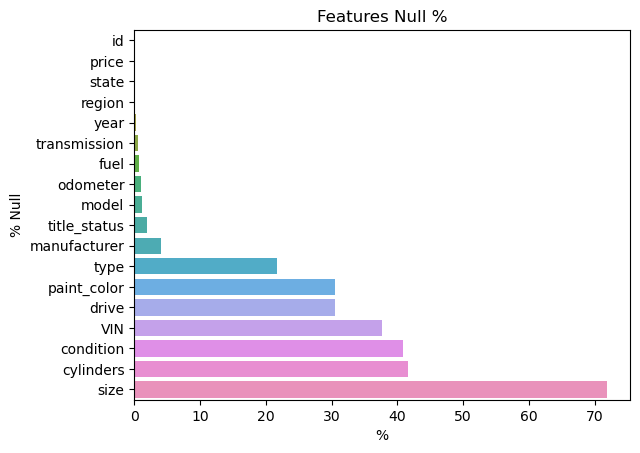

In [7]:
sns.barplot(data = veh_null, y = 'Feature', x = '%')
plt.title('Features Null %')
plt.xticks(rotation=0)
plt.ylabel('% Null')

Many of the numeric columns can be replaced with an average (such as the year) and some of the categorical columns, such as transmission, can be replaced with the most frequent value, below is a column by column analysis.

<span style="text-decoration:underline">id</span>: we can use this column as an index or we can drop this column, i choose drop it<br/>
<span style="text-decoration:underline">price</span>: target variable, some prices have a value of 0, these zeros will be replaced by the mean. <br/>
<span style="text-decoration:underline">state</span>: categorical variable without null values<br/>
<span style="text-decoration:underline">region</span>: categorical variable without null values.<br/>
<span style="text-decoration:underline">year</span>: we can reeplace values using the most frequently value<br/>
<span style="text-decoration:underline">transmission</span>: we can replace the nulls with the value 'other'<br/>
<span style="text-decoration:underline">fuel</span>: we can replace the nulls with the value 'other'.<br/>
<span style="text-decoration:underline">odometer</span>: we can average the values of all vehicles and assign this average to the null values<br/>
<span style="text-decoration:underline">model</span>: This feature has too many categorical values, the idea here is to eliminate the null values once we have imputed the rest of the features.<br/>
<span style="text-decoration:underline">title_status</span>: we can reeplace values using the most frequently value<br/>
<span style="text-decoration:underline">manufacturer</span>: This column has a significant amount of null values, but I think it is possible to use the most frequently used value<br/>
<span style="text-decoration:underline">type</span>: This column is important but has almost 22% of null values, we can replace the nulls with the value 'other'<br/>
<span style="text-decoration:underline">paint_color</span>: we can reeplace values using the most frequently value<br/>
<span style="text-decoration:underline">drive</span>: This column is important but has almost 30% of null values, we will apply the most frequent value as long as it does not exceed 50% of null values<br/>
<span style="text-decoration:underline">VIN</span>: this column is a unique identifier and can be dropped<br/>
<span style="text-decoration:underline">condition</span>: we will apply the most frequent value<br/>
<span style="text-decoration:underline">cylinders</span>: First at all it is possible to convert this column to numerical. Second, approximately 41% of the values are null, almost 50%. I will take the risk to impute them with the most frequent value<br/>
<span style="text-decoration:underline">size</span>: size is a value that has almost no useful values since the nulls represent 71% (> 50% null values) of the total dataset, this column should be dropped<br/>

There are some records that are not really worth saving and they are all those that only have the price of the vehicle and no other data (except for the state and region), these data will be removed from the datset.

now, let's check all the categorical columns in order to identify them well.

In [8]:
cats = ['state', 'region', 'transmission', 'fuel', 'model', 'title_status', 'manufacturer', 'type', 'paint_color', 'drive', 'condition', 'cylinders']
for cat in cats:
    temp_cat_df = vehicles[cat].value_counts().reset_index().sort_values(by = 'count', ascending = False)
    display(temp_cat_df)

,state,count
0,ca,50614
1,fl,28511
2,tx,22945
3,ny,19386
4,oh,17696
5,or,17104
6,mi,16900
7,nc,15277
8,wa,13861
9,pa,13753


,region,count
0,columbus,3608
1,jacksonville,3562
2,spokane / coeur d'alene,2988
3,eugene,2985
4,fresno / madera,2983
...,...,...
399,meridian,28
400,southwest MS,14
401,kansas city,11
402,"fort smith, AR",9


,transmission,count
0,automatic,336524
1,other,62682
2,manual,25118


,fuel,count
0,gas,356209
1,other,30728
2,diesel,30062
3,hybrid,5170
4,electric,1698


,model,count
0,f-150,8009
1,silverado 1500,5140
2,1500,4211
3,camry,3135
4,silverado,3023
...,...,...
19459,cr-v lx automatic,1
19460,tacoma double cab trd 4x4,1
19461,avenger r/t 4dr sedan,1
19462,yukon xl slt suv,1


,title_status,count
0,clean,405117
1,rebuilt,7219
2,salvage,3868
3,lien,1422
4,missing,814
5,parts only,198


,manufacturer,count
0,ford,70985
1,chevrolet,55064
2,toyota,34202
3,honda,21269
4,nissan,19067
5,jeep,19014
6,ram,18342
7,gmc,16785
8,bmw,14699
9,dodge,13707


,type,count
0,sedan,87056
1,SUV,77284
2,pickup,43510
3,truck,35279
4,other,22110
5,coupe,19204
6,hatchback,16598
7,wagon,10751
8,van,8548
9,convertible,7731


,paint_color,count
0,white,79285
1,black,62861
2,silver,42970
3,blue,31223
4,red,30473
5,grey,24416
6,green,7343
7,custom,6700
8,brown,6593
9,yellow,2142


,drive,count
0,4wd,131904
1,fwd,105517
2,rwd,58892


,condition,count
0,good,121456
1,excellent,101467
2,like new,21178
3,fair,6769
4,new,1305
5,salvage,601


,cylinders,count
0,6 cylinders,94169
1,4 cylinders,77642
2,8 cylinders,72062
3,5 cylinders,1712
4,10 cylinders,1455
5,other,1298
6,3 cylinders,655
7,12 cylinders,209


Many of the data have null problems and some values of the target variable have strange values such as 0 and 1 which must be removed as they are unrealistic.

Next we need to check out our target variable 

In [9]:
price_me = vehicles['price'].mean()

In [10]:
price_df = vehicles['price'].replace(0, price_me).replace(1, price_me).to_frame()
price_df

,price
0,6000.0
1,11900.0
2,21000.0
3,1500.0
4,4900.0
...,...
426875,23590.0
426876,30590.0
426877,34990.0
426878,28990.0


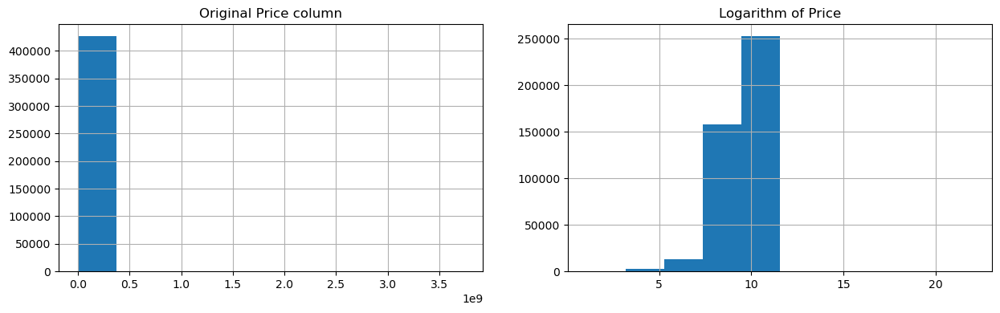

In [11]:
fig, ax = plt.subplots(1, 2, figsize = (15, 4))
ax[0].hist(price_df[['price']])
ax[0].grid()
ax[0].set_title('Original Price column')
ax[1].hist(np.log1p(price_df['price']))
ax[1].grid()
ax[1].set_title('Logarithm of Price');

As we can see our target variable is somewhat skewed so we will proceed to apply a logarithmic transformation method later on if required.

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

___

<h4 style="color:Blue">Definition</h4> 

Once we have identified the problems in the dataset we proceed to correct them in order to have good quality data.

<h4 style="color:Blue">Imputing and Cleaning</h4>

Let's start applying the imputer for some features

In [12]:
veh_null = vehicles.isnull().sum().sort_values().reset_index()
veh_null.columns = ['Feature', 'Count']
veh_null['%'] = round(veh_null['Count'] / len(vehicles)* 100, 2 )
veh_null

,Feature,Count,%
0,id,0,0.00
1,price,0,0.00
2,state,0,0.00
3,region,0,0.00
4,year,1205,0.28
5,transmission,2556,0.60
6,fuel,3013,0.71
7,odometer,4400,1.03
8,model,5277,1.24
9,title_status,8242,1.93


In [13]:
#Copying the data
vehicles_clean = vehicles.copy()

#Dropping useless features, outliers
vehicles_clean['price'] = vehicles_clean['price'].astype('int64')

#zscore
vehicles_clean['z_score'] = stats.zscore(vehicles_clean['price'])
zcore_index = vehicles_clean.loc[(vehicles_clean['z_score'] > 0.1)].index
vehicles_clean = vehicles_clean.drop(zcore_index)
vehicles_clean = vehicles_clean.drop(['z_score'], axis = 1)
#IQR
q1 = vehicles_clean['price'].quantile(0.25)
q3 = vehicles_clean['price'].quantile(0.75)
iqr = q3 - q1
low_lim = q1 - 0.27 * iqr
upper_lim = q3 + 2.5 * iqr
iqr_index = vehicles_clean[(vehicles_clean['price'] < low_lim) | (vehicles_clean['price'] > upper_lim)].index
vehicles_clean = vehicles_clean.drop(iqr_index)

vehicles_clean = vehicles_clean.drop(['VIN', 'size', 'id'], axis = 1)
vehicles_clean = vehicles_clean.reset_index(drop = True)

#imputing the data
imputer_trans = make_column_transformer(
    (SimpleImputer(missing_values = np.nan, strategy='mean'), ['odometer']),
    (SimpleImputer(missing_values = np.nan, strategy='most_frequent'), ['year','cylinders'])
)

vehicles_clean['cylinders'] = vehicles_clean['cylinders'].str.replace(' cylinders', '').str.replace('other', '6').str.strip()
temp_imp_cols = pd.DataFrame(imputer_trans.fit_transform(vehicles_clean), columns = ['odometer', 'year', 'cylinders'])

#si_data = SimpleImputer(missing_values=np.nan, strategy='mean')
vehicles_clean['odometer'] = temp_imp_cols['odometer'].astype('int64')#si_data.fit_transform(vehicles_clean[['odometer']]).round(2)
#si_data = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
vehicles_clean['year'] = temp_imp_cols['year']#si_data.fit_transform(vehicles_clean[['year']])
vehicles_clean['year'] = vehicles_clean['year'].astype('int32')
vehicles_clean['transmission'] = vehicles['transmission'].fillna('other')
vehicles_clean['fuel'] = vehicles['fuel'].fillna('other')
#vehicles_clean['model'] = vehicles['fuel'].fillna('other')
vehicles_clean['title_status'] = vehicles['title_status'].fillna('clean')
vehicles_clean['manufacturer'] = vehicles['manufacturer'].fillna('other')
vehicles_clean['type'] = vehicles['type'].fillna('other')
vehicles_clean['paint_color'] = vehicles['paint_color'].fillna('white')
vehicles_clean['drive'] = vehicles['drive'].fillna('4wd')
vehicles_clean['condition'] = vehicles['condition'].fillna('good')
#vehicles_clean['cylinders'] = #vehicles_clean['cylinders'].str.replace(' cylinders', '').str.replace('other', '6').str.strip()
vehicles_clean['cylinders'] =  temp_imp_cols['cylinders'].astype('int32')#si_data.fit_transform(vehicles_clean[['cylinders']]).astype('int32')

#Dropping null data
vehicles_clean = vehicles_clean.dropna()

display(vehicles_clean)

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state
22,auburn,33590,2014,other,sierra 1500 crew cab slt,good,8,other,57923,clean,other,4wd,other,white,al
23,auburn,22590,2010,other,silverado 1500,good,8,other,71229,clean,other,4wd,other,white,al
24,auburn,39590,2020,other,silverado 1500 crew,good,8,other,19160,clean,other,4wd,other,white,al
25,auburn,30990,2017,other,tundra double cab sr,good,8,other,41124,clean,other,4wd,other,white,al
26,auburn,15000,2013,other,f-150 xlt,good,6,other,128000,clean,other,4wd,other,white,al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384508,wyoming,23590,2019,ford,maxima s sedan 4d,good,6,gas,32226,clean,automatic,4wd,truck,black,wy
384509,wyoming,30590,2020,ram,s60 t5 momentum sedan 4d,good,6,gas,12029,clean,automatic,4wd,truck,white,wy
384510,wyoming,34990,2020,dodge,xt4 sport suv 4d,good,6,gas,4174,clean,automatic,rwd,sedan,white,wy
384511,wyoming,28990,2018,ford,es 350 sedan 4d,good,6,gas,30112,clean,automatic,4wd,other,white,wy


Let's detect duplicates values and remove them

In [14]:
vehicles_clean.duplicated().value_counts()

False    379865
True        257
Name: count, dtype: int64

In [15]:
vehicles_clean = vehicles_clean.drop_duplicates()

In [16]:
vehicles_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 379865 entries, 22 to 384512
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   region        379865 non-null  object
 1   price         379865 non-null  int64 
 2   year          379865 non-null  int32 
 3   manufacturer  379865 non-null  object
 4   model         379865 non-null  object
 5   condition     379865 non-null  object
 6   cylinders     379865 non-null  int32 
 7   fuel          379865 non-null  object
 8   odometer      379865 non-null  int64 
 9   title_status  379865 non-null  object
 10  transmission  379865 non-null  object
 11  drive         379865 non-null  object
 12  type          379865 non-null  object
 13  paint_color   379865 non-null  object
 14  state         379865 non-null  object
dtypes: int32(2), int64(2), object(11)
memory usage: 43.5+ MB


Here we check for null values

In [17]:
veh_null = vehicles_clean.isnull().sum().sort_values().reset_index()
veh_null.columns = ['Feature', 'Count']
veh_null['%'] = round(veh_null['Count'] / len(vehicles_clean)* 100, 2 )
veh_null

,Feature,Count,%
0,region,0,0.0
1,price,0,0.0
2,year,0,0.0
3,manufacturer,0,0.0
4,model,0,0.0
5,condition,0,0.0
6,cylinders,0,0.0
7,fuel,0,0.0
8,odometer,0,0.0
9,title_status,0,0.0


<h4 style="color:Blue">Correlations</h4>

Now we need to plot the correlations between numerical variables. The idea is to verify if any feature has a correlation with another in order to eliminate it.

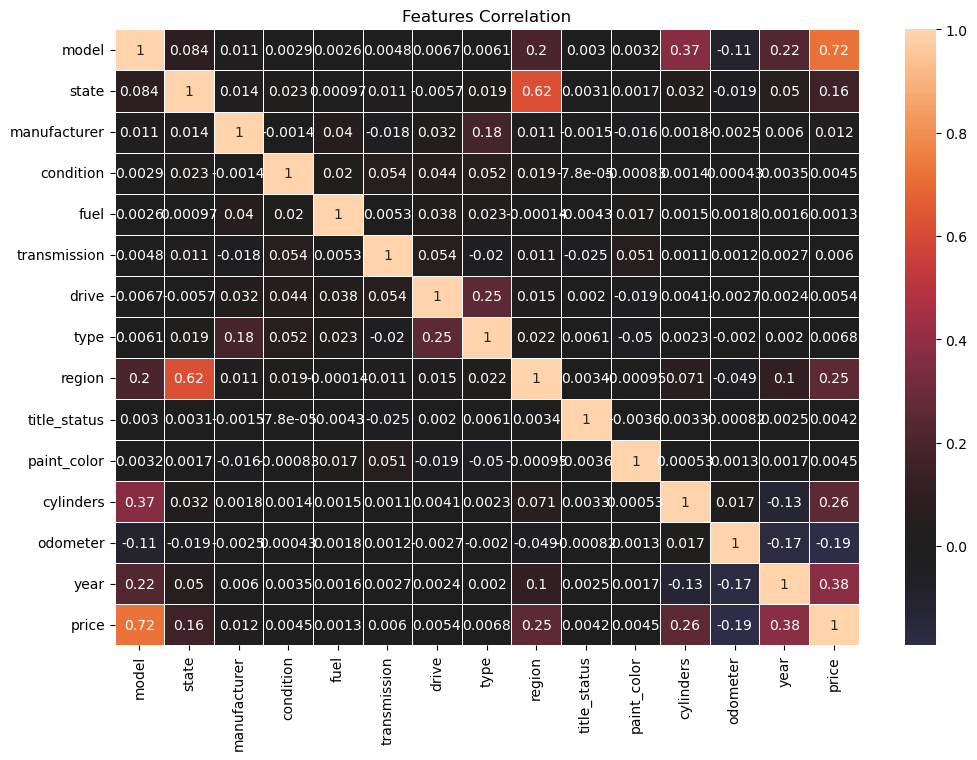

In [18]:
#sns.pairplot(vehicles_clean[['price', 'cylinders', 'odometer', 'year']], kind="reg", diag_kind="kde")

cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color']
trg_enc = TargetEncoder()
vehicle_corr = pd.concat([trg_enc.fit_transform(vehicles_clean[cats] , vehicles_clean["price"]), vehicles_clean[['cylinders', 'odometer', 'year', 'price']]], axis = 1).corr()

sns.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(vehicle_corr, center = 0, linewidth = .5, annot = True).set(title='Features Correlation');


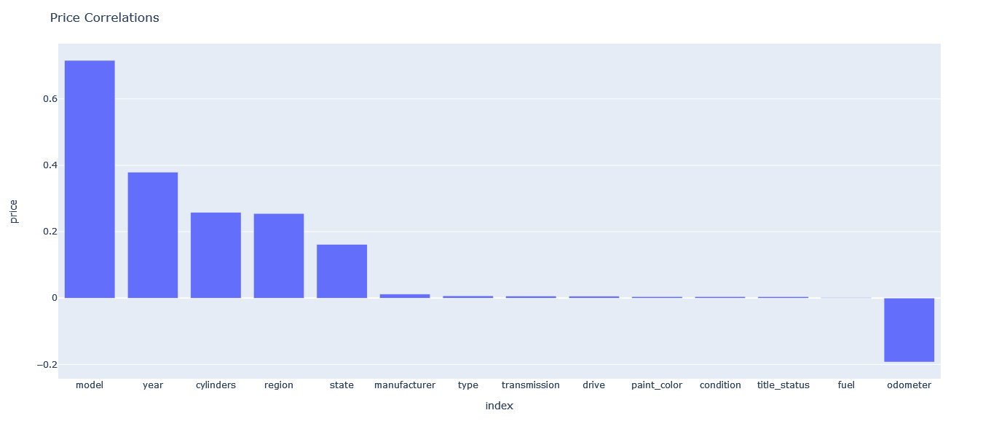

In [19]:
vehicle_corr_price = vehicle_corr[['price']].sort_values(by = 'price', ascending = False).reset_index()
fig = px.bar(vehicle_corr_price[1:], x = 'index', y = 'price')
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Price Correlations"
)

fig.show()

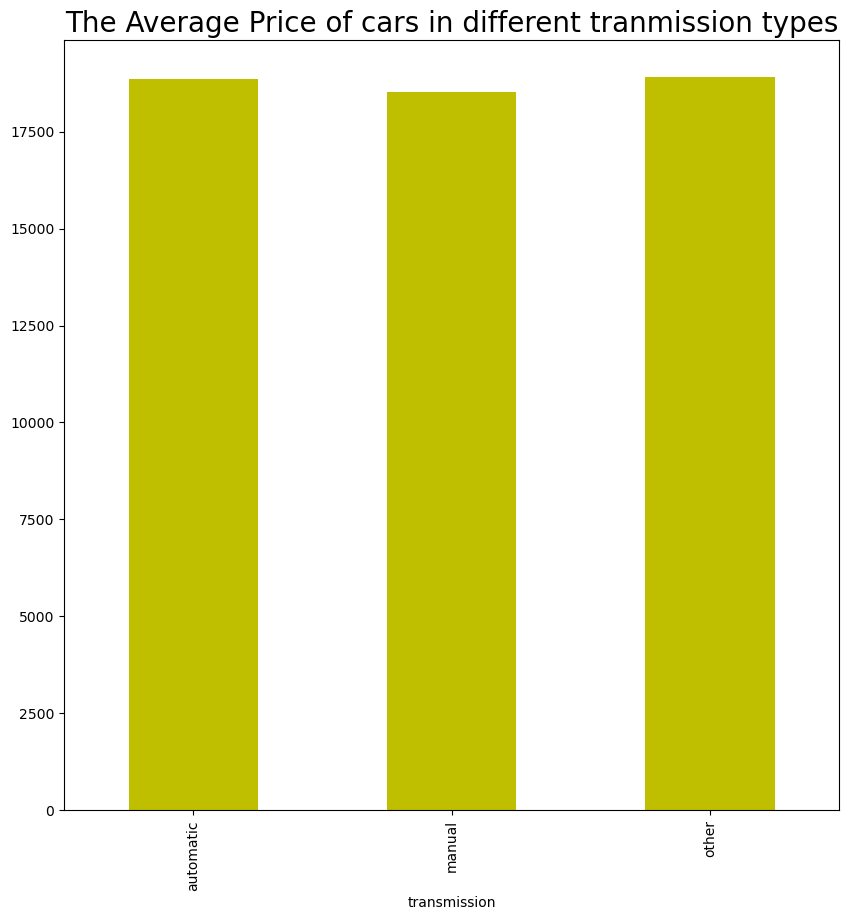

In [20]:
plt.figure(figsize = (10, 10))
vehicles_clean.groupby('transmission')['price'].mean().plot(kind = 'bar', color = 'y')
plt.title("The Average Price of cars in different tranmission types", fontsize = 20)
plt.show()

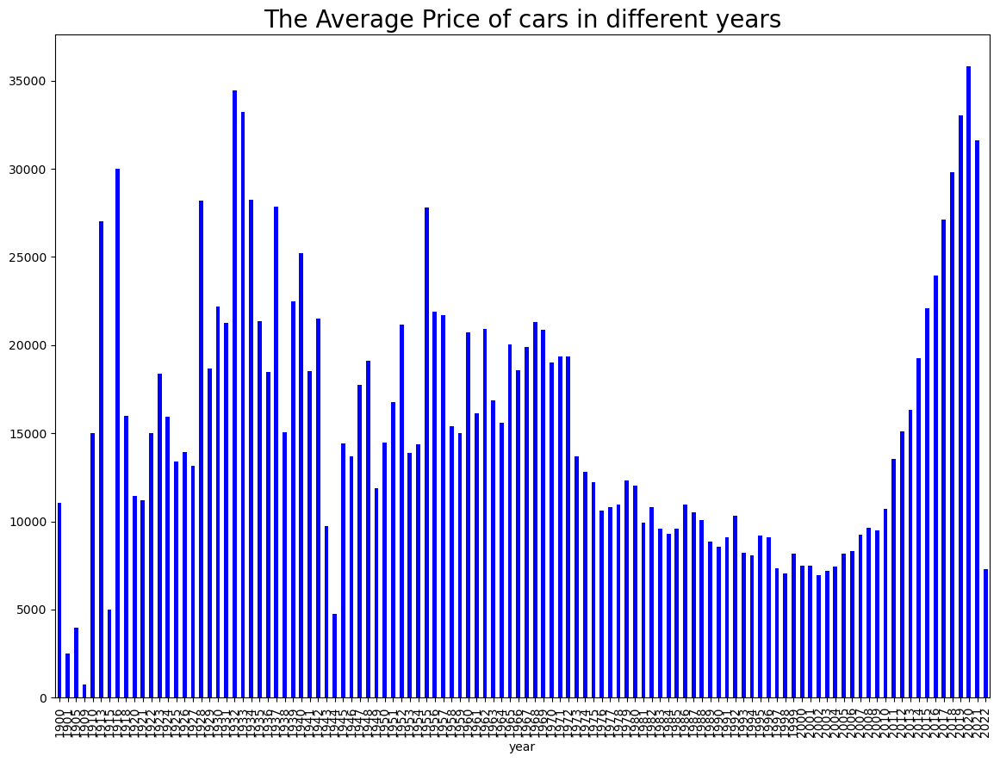

In [21]:
plt.figure(figsize = (14, 10))
vehicles_clean.groupby('year')['price'].mean().plot(kind = 'bar', color = 'b')
plt.title("The Average Price of cars in different years", fontsize = 20)
plt.show()

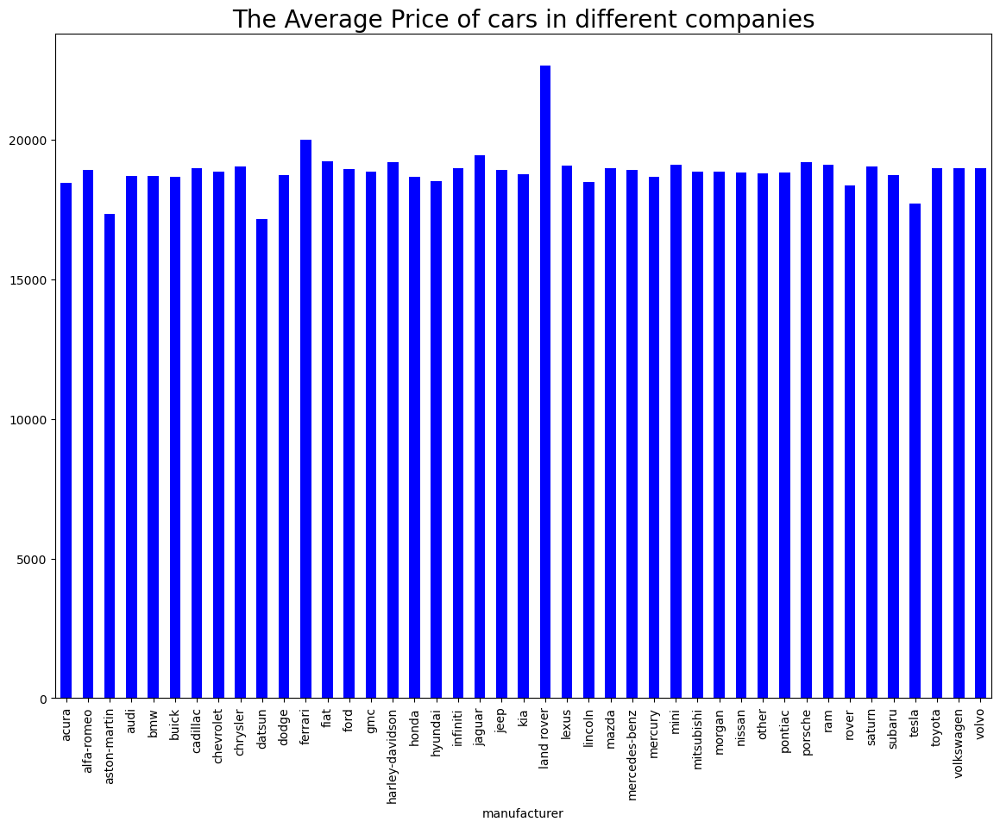

In [22]:
plt.figure(figsize = (14, 10))
vehicles_clean.groupby('manufacturer')['price'].mean().plot(kind = 'bar', color = 'b')
plt.title("The Average Price of cars in different companies", fontsize = 20)
plt.show()

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

___

<h4 style="color:Blue">Definition</h4> 

Once we have our data ready, we proceed to search for the best model, using Ridge, Lasso, LinearRegression and GridSearch to find the best possible model.

<h4 style="color:Blue">Splitting</h4>

In [23]:
X = vehicles_clean.drop(['price'], axis = 1)
y = vehicles_clean['price']

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40)
X_train

,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state
139331,south bend / michiana,2013,jeep,ls 460 l sedan 4d,good,8,gas,60271,rebuilt,automatic,fwd,SUV,white,in
360458,bellingham,2013,ford,grand caravan,good,6,gas,87849,clean,automatic,fwd,pickup,white,wa
305797,scranton / wilkes-barre,2007,mercedes-benz,silverado,good,6,gas,240000,clean,automatic,4wd,other,white,pa
238741,santa fe / taos,2013,chevrolet,mustang boss 302 coupe 2d,good,8,gas,33692,clean,automatic,4wd,other,white,nm
350253,vermont,2014,acura,silverado lt 4x4,good,6,other,107000,clean,other,4wd,sedan,black,vt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320689,knoxville,2008,ford,hummer h2,good,6,gas,67836,clean,other,fwd,sedan,silver,tn
322903,memphis,2014,rover,tahoe,good,8,gas,117530,clean,automatic,4wd,SUV,white,tn
359760,winchester,2014,toyota,cr-v,good,4,gas,106061,clean,automatic,4wd,other,white,va
296449,harrisburg,2010,ford,sonata,excellent,4,gas,17430,clean,automatic,4wd,other,white,pa


In [25]:
y_train

139331    32590
360458    10999
305797    16000
238741    35590
350253    23995
          ...  
320689    47991
322903    19999
359760    13500
296449    27650
379610    22950
Name: price, Length: 265905, dtype: int64

<h4 style="color:Blue">Models</h4>

In this section we start the search for the best model

In [26]:
results = pd.DataFrame({'Model': [], 'MSE Training': [], 'MSE Dev': [], 'R2 Training': [], 'R2 Dev' : [], 'Degree': [], 'Alpha': [], 'Features': [] })
results

,Model,MSE Training,MSE Dev,R2 Training,R2 Dev,Degree,Alpha,Features


<h4 style="color:Green">Simple Linear Regression</h4>

<label style="color:Purple">Model pipeline</label>

In [27]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color']
transf = make_column_transformer(
        (TargetEncoder(), cats),
        remainder='passthrough'
)

linear_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler()),
        ('model', LinearRegression())
        #('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
linear_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color'])])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Fitting</label>

In [28]:
linear_pipe.fit(X_train, y_train)

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color'])])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Error</label>

In [29]:
y_train_predict = linear_pipe.predict(X_train).astype(int)
y_test_predict = linear_pipe.predict(X_test).astype(int)

train_mse = mean_squared_error(y_train, y_train_predict)
test_mse = mean_squared_error(y_test, y_test_predict)
train_r2 = r2_score(y_train, y_train_predict)
test_r2 = r2_score(y_test, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Linear Regression', 
        'MSE Trainig': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': 'NA', 
        'Alpha': 'NA', 
        'Features': 'All'
    }, index=[0])])

Train MSE: 81685820.62375285
Test MSE: 86812550.18499474
Train R2: 0.5724652813918252
Test R2: 0.5487843843235194


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,34325,30990
1,24565,23590
2,15384,500
3,31826,37900
4,12793,12999
...,...,...
113955,7355,8900
113956,31825,32990
113957,6195,7498
113958,-3133,1500


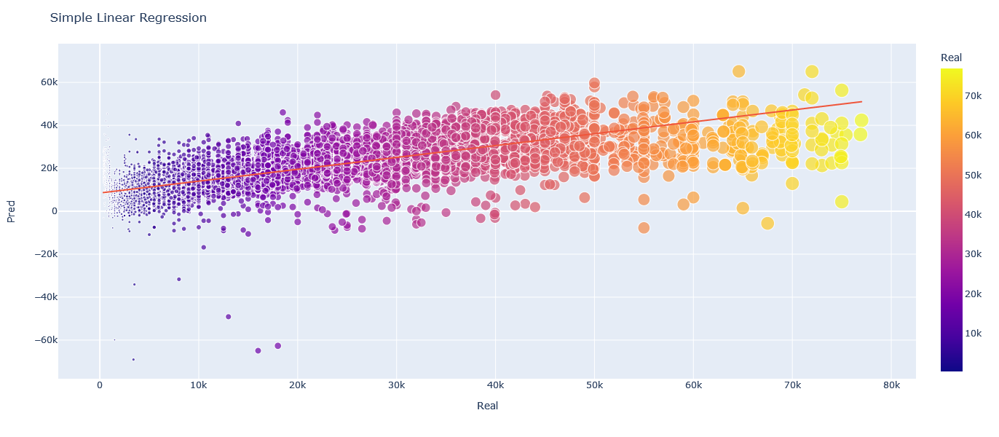

In [30]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Simple Linear Regression"
)

fig.show()

<h4 style="color:Green">Simple Linear Regression with Polynomial</h4>

<label style="color:Purple">Searching for the polynomial degree</label>

We create the pipeline to start the training. We take the polynomial grade obtained earlier and apply it to the model. We need to use a sparse matrix as there are too many categorical columns.

In [31]:
train_mses = []
test_mses = []

for i in range(1, 5):
    transf = make_column_transformer(
        (TargetEncoder(), cats),
        (PolynomialFeatures(degree = i), make_column_selector(dtype_include=np.number)))
    pipe = Pipeline([('transformer', transf), ('linreg', LinearRegression())])
    
    pipe.fit(X_train, y_train)
    pred_train = pipe.predict(X_train)
    pred_test = pipe.predict(X_test)
    train_mse = mean_squared_error(y_train, pred_train)
    test_mse = mean_squared_error(y_test, pred_test)
    train_mses.append(train_mse)
    test_mses.append(test_mse)
    
display(train_mses)
display(test_mses)
degree = test_mses.index(min(test_mses)) + 1

[81686158.42244019, 65941955.87742143, 73514472.33524497, 122908524.96660756]

[86812839.71385284, 69726434.42402387, 77973830.4468981, 125475887.83309725]

The Complexity that minimized Test Error was: 2


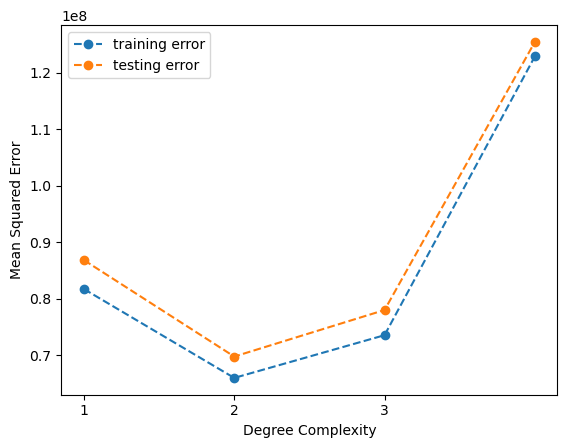

In [32]:
print(f'The Complexity that minimized Test Error was: {test_mses.index(min(test_mses)) + 1}')
plt.plot(range(1, 5), train_mses, '--o', label = 'training error')
plt.plot(range(1, 5), test_mses, '--o', label = 'testing error')
plt.xticks(range(1, 4), range(1, 4))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.legend();

<label style="color:Purple">Model Pipeline</label>

In [33]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color']
transf = make_column_transformer(
        (TargetEncoder(), cats),
        (PolynomialFeatures(degree = degree), make_column_selector(dtype_include=np.number)),
        remainder='passthrough'
)

linear_pol_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler()),
        ('model', LinearRegression())
    ])
linear_pol_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000173116B9FD0>)])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Fitting</label>

In [34]:
linear_pol_pipe.fit(X_train, y_train)

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000173116B9FD0>)])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Error</label>

In [35]:
y_train_predict = linear_pol_pipe.predict(X_train).astype(int)
y_test_predict = linear_pol_pipe.predict(X_test).astype(int)

train_mse = mean_squared_error(y_train, y_train_predict)
test_mse = mean_squared_error(y_test, y_test_predict)
train_r2 = r2_score(y_train, y_train_predict)
test_r2 = r2_score(y_test, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Linear Regression with Polynomial', 
        'MSE Trainig': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': 'NA', 
        'Alpha': 'NA', 
        'Features': 'All'
    }, index=[1])])

Train MSE: 65941707.01861943
Test MSE: 69726198.46382064
Train R2: 0.6548682630660834
Test R2: 0.6375921511165177


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,37638,30990
1,29378,23590
2,19269,500
3,37521,37900
4,12488,12999
...,...,...
113955,-1950,8900
113956,34865,32990
113957,7750,7498
113958,21419,1500


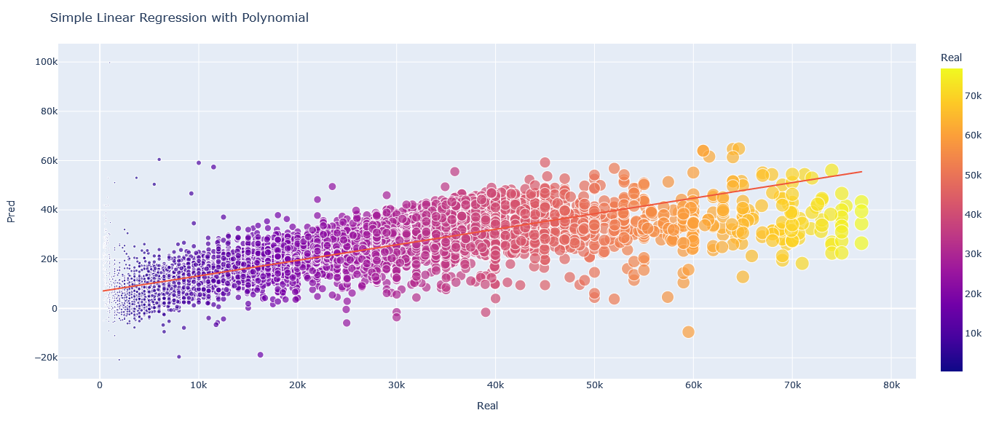

In [36]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Simple Linear Regression with Polynomial"
)

fig.show()

<h4 style="color:Green">Ridge with Polynomial</h4>

<label style="color:Purple">Model Pipeline</label>

In [37]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color']
transf = make_column_transformer(
        (TargetEncoder(), cats),
        (PolynomialFeatures(degree = degree), make_column_selector(dtype_include=np.number)),
        remainder='passthrough'
)

rid_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler()),
        ('model', Ridge())
        #('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
rid_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000017311678D10>)])),
                ('stdscl', StandardScaler()), ('model', Ridge())])

<label style="color:Purple">Model Fitting</label>

In [38]:
%%time
alpha = np.logspace(-5, 10, 10)
rid_param_dict = {'model__alpha': alpha}
rid_grid = GridSearchCV(rid_pipe, param_grid=rid_param_dict, scoring = 'neg_mean_squared_error')
rid_grid.fit(X_train, y_train)
best_estimator = rid_grid.best_estimator_

CPU times: total: 1min 51s
Wall time: 1min 2s


<label style="color:Purple">Model Error</label>

In [39]:
y_train_predict = best_estimator.predict(X_train).astype(int)
#y_train_predict = y_train_predict.astype(int)

y_test_predict = best_estimator.predict(X_test).astype(int)
#y_test_predict = y_test_predict.astype(int)

train_mse = mean_squared_error(y_train, y_train_predict)
test_mse = mean_squared_error(y_test, y_test_predict)
train_r2 = r2_score(y_train, y_train_predict)
test_r2 = r2_score(y_test, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

rid_best_regressor = best_estimator.named_steps['model']
print(f'Best alpha: {rid_best_regressor.alpha}')
print(f'Score: {np.abs(rid_grid.best_score_)}')

alpha = rid_best_regressor.alpha

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Ridge with Polynomial', 
        'MSE Trainig': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': 'NA', 
        'Alpha': alpha, 
        'Features': 'All'
    }, index=[3])])
best_estimator_final = best_estimator

Train MSE: 65941703.605644874
Test MSE: 69726197.028159
Train R2: 0.6548682809292219
Test R2: 0.6375921585784912
Best alpha: 1e-05
Score: 70010064.97297606


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,37638,30990
1,29378,23590
2,19269,500
3,37521,37900
4,12488,12999
...,...,...
113955,-1950,8900
113956,34865,32990
113957,7750,7498
113958,21418,1500


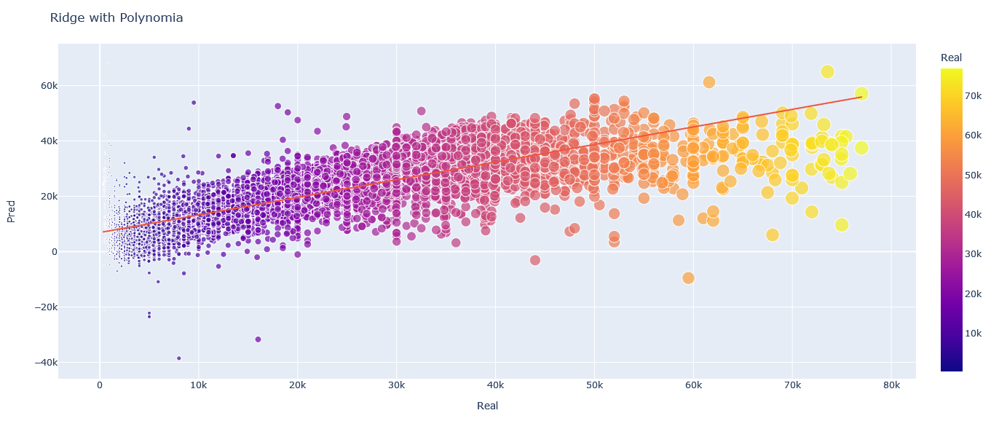

In [40]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Ridge with Polynomia"
)

fig.show()

<h4 style="color:Green">Lasso, SequentialFeatureSelector with Polynomial</h4>

<label style="color:Purple">Model Pipeline</label>

In [41]:
transf = make_column_transformer(
        (PolynomialFeatures(degree = degree, include_bias = False), make_column_selector(dtype_include=np.number)))
    
lasso_pol_pipe = Pipeline([('transf', transf),
                 ('selector', SequentialFeatureSelector(Lasso())),
                 ('lasmodel', Lasso())])
lasso_pol_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(include_bias=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000017311726A50>)])),
                ('selector', SequentialFeatureSelector(estimator=Lasso())),
                ('lasmodel', Lasso())])

<label style="color:Purple">Model Fitting</label>

In [42]:
%%time
n_feat = [4,5,6]
param_dict = {'selector__n_features_to_select' : n_feat}
grid = GridSearchCV(lasso_pol_pipe, param_grid=param_dict, scoring = 'neg_mean_squared_error')
grid.fit(X_train, y_train)
best_estimator = grid.best_estimator_

CPU times: total: 19min 12s
Wall time: 3min 15s


<label style="color:Purple">Model Error</label>

In [43]:
best_selector = best_estimator.named_steps['selector']
best_model = best_estimator.named_steps['lasmodel']
best_transf = best_estimator.named_steps['transf']

y_train_predict = best_estimator.predict(X_train).astype(int)
#y_train_predict = y_train_predict.astype(int)

y_test_predict = best_estimator.predict(X_test).astype(int)
#y_test_predict = y_test_predict.astype(int)

train_mse = mean_squared_error(y_train, y_train_predict)
test_mse = mean_squared_error(y_test, y_test_predict)
train_r2 = r2_score(y_train, y_train_predict)
test_r2 = r2_score(y_test, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

print(f'Best alpha: {best_model.alpha}')
print(f'Score: {np.abs(grid.best_score_)}')

feature_names = best_transf.get_feature_names_out()[best_selector.get_support()]
display(pd.DataFrame({'Selected Columns:': [cols.replace('polynomialfeatures__', '') for cols in feature_names]}))

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Lasso, SequentialFeatureSelector with Polynomial', 
        'MSE Trainig': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': 'NA', 
        'Alpha': best_model.alpha, 
        'Features': len(feature_names)
    }, index=[3])])

Train MSE: 123609688.10868168
Test MSE: 126265228.46276763
Train R2: 0.353040309575805
Test R2: 0.34372573230538794
Best alpha: 1.0
Score: 123640392.62748194


,Selected Columns:
0,year
1,cylinders
2,year^2
3,year odometer
4,cylinders^2
5,odometer^2


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,29112,30990
1,28811,23590
2,24394,500
3,35059,37900
4,12742,12999
...,...,...
113955,-10937,8900
113956,28497,32990
113957,18701,7498
113958,-635,1500


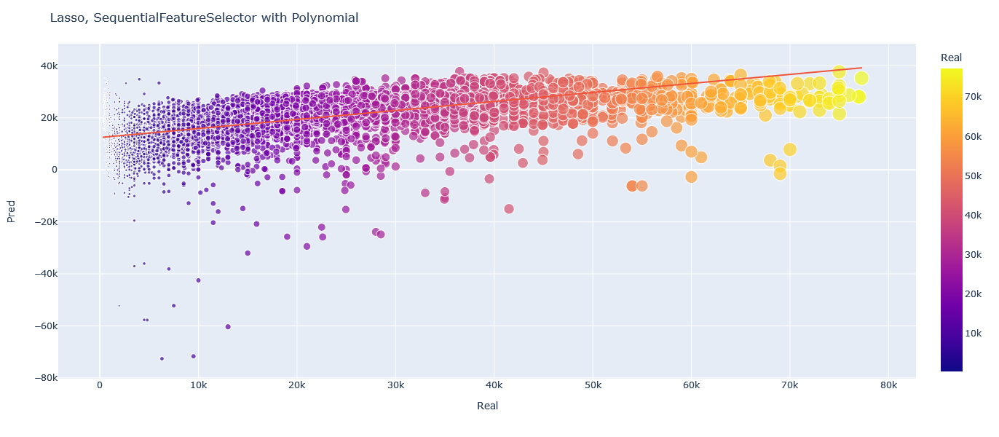

In [44]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Lasso, SequentialFeatureSelector with Polynomial"
)

fig.show()

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

____


<h4 style="color:Blue">Definition</h4> 

We proceed to evaluate our model to verify if it is really good at making predictions.

<h4 style="color:Blue">MSE Evaluation</h4> 

We evaluate the best MSE and best R2

In [45]:
results

,Model,MSE Training,MSE Dev,R2 Training,R2 Dev,Degree,Alpha,Features,MSE Trainig
0,Linear Regression,NaN,8.681255e+07,0.572465,0.548784,NA,NA,All,8.168582e+07
1,Linear Regression with Polynomial,NaN,6.972620e+07,0.654868,0.637592,NA,NA,All,6.594171e+07
3,Ridge with Polynomial,NaN,6.972620e+07,0.654868,0.637592,NA,0.00001,All,6.594170e+07
3,"Lasso, SequentialFeatureSelector with Polynomial",NaN,1.262652e+08,0.353040,0.343726,NA,1.0,6,1.236097e+08


<h4 style="color:Blue">Feature Weight</h4> 

Here we look for which characteristics have a considerable weight in the price calculation, for that we will use permutation importance

In [46]:
%%time
importances = permutation_importance(best_estimator_final, X_train, y_train, n_repeats = 5, random_state=40)

CPU times: total: 26.2 s
Wall time: 26 s


In [47]:
importances_tr = dict(zip(X_train.columns, importances.importances_mean))
display(importances_tr)
importances_tr = {k : v for k ,v in sorted(importances_tr.items(), key = lambda x: x[1], reverse = True)}
display(importances_tr)

import_df = pd.DataFrame(importances_tr.values(), index=importances_tr.keys(), columns = ['Importances'])
display(import_df)

{'region': 0.005044193415089637,
 'year': 0.2370942597471787,
 'manufacturer': 1.884534256044734e-05,
 'model': 0.513721227810261,
 'condition': 6.583238364443744e-07,
 'cylinders': 0.02191995404135303,
 'fuel': 3.481217142264903e-06,
 'odometer': 0.031038175384434076,
 'title_status': 8.219617512317256e-06,
 'transmission': 2.6430279359113127e-06,
 'drive': 1.2783777942448893e-06,
 'type': 4.6010853123057415e-07,
 'paint_color': 6.228078062053832e-06,
 'state': 0.005319756563045064}

{'model': 0.513721227810261,
 'year': 0.2370942597471787,
 'odometer': 0.031038175384434076,
 'cylinders': 0.02191995404135303,
 'state': 0.005319756563045064,
 'region': 0.005044193415089637,
 'manufacturer': 1.884534256044734e-05,
 'title_status': 8.219617512317256e-06,
 'paint_color': 6.228078062053832e-06,
 'fuel': 3.481217142264903e-06,
 'transmission': 2.6430279359113127e-06,
 'drive': 1.2783777942448893e-06,
 'condition': 6.583238364443744e-07,
 'type': 4.6010853123057415e-07}

,Importances
model,5.137212e-01
year,2.370943e-01
odometer,3.103818e-02
cylinders,2.191995e-02
state,5.319757e-03
region,5.044193e-03
manufacturer,1.884534e-05
title_status,8.219618e-06
paint_color,6.228078e-06
fuel,3.481217e-06


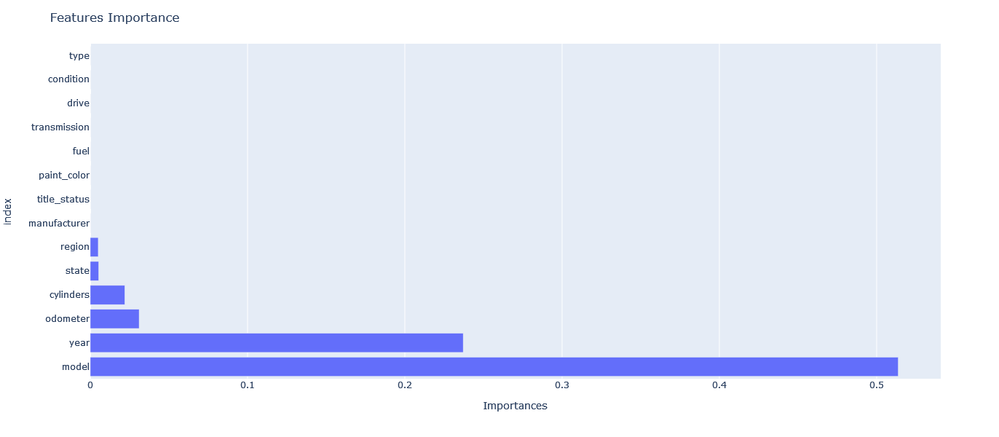

In [48]:
fig = px.bar(import_df, x="Importances")
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title="Features Importance"
)
fig.show()

In [57]:
best_scaler = best_estimator_final.named_steps['stdscl']
best_transf = best_estimator_final.named_steps['transf']
best_model = best_estimator_final.named_steps['model']
coefs = best_model.coef_
feat_names = [cols.replace('polynomialfeatures__', '').replace('targetencoder__', '') for cols in best_transf.get_feature_names_out()]

In [58]:
coefs_tr = dict(zip(feat_names, coefs))
coefs_tr = {k : v for k ,v in sorted(coefs_tr.items(), key = lambda x: x[1], reverse = True)}

coefs_df = pd.DataFrame(coefs_tr.values(), index=coefs_tr.keys(), columns = ['Coef']).reset_index().rename(columns={'index': 'Feature'})

best_transf = best_estimator_final.named_steps['transf']
X_train_preprocessed = pd.DataFrame(
    best_transf.transform(X_train)
    
)

#coefs_df['Coef'] = coefs * X_train_preprocessed.std(axis=0)
display(coefs_df)

,Feature,Coef
0,year^2,512175.619279
1,year cylinders,57434.511824
2,model,7004.193221
3,odometer^2,3446.367844
4,odometer,2274.741031
5,state,710.818428
6,region,689.992729
7,cylinders^2,198.827809
8,manufacturer,38.423849
9,title_status,30.895245


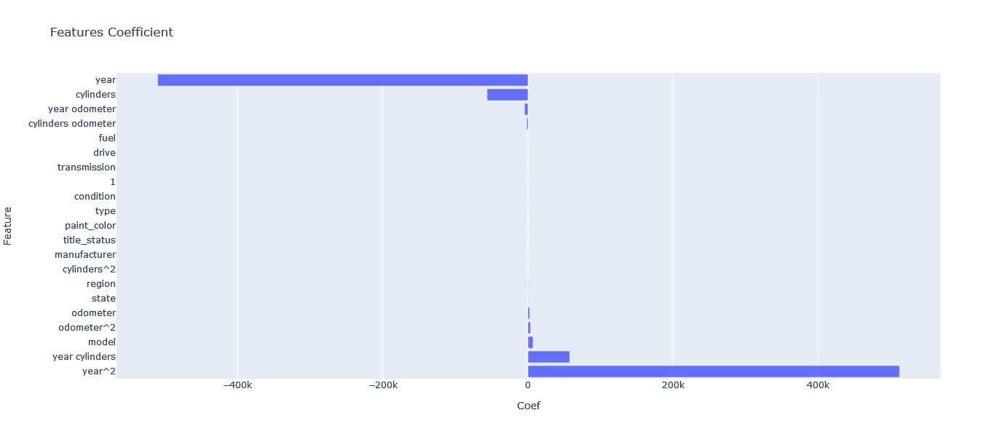

In [59]:
fig = px.bar(coefs_df, y="Feature", x="Coef", title="Gráfico de barras horizontales")
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Features Coefficient"
)
fig.show()

In [ ]:
X_test_trans.iloc[0:1].values

In [ ]:
ste = StandardScaler()
x_conv = ste.fit_transform(X_test_trans)
x_conv[0]

In [ ]:
rid_best_regressor.intercept_

In [ ]:
rid_best_estimator.predict(X_test.iloc[0:2])

<h4 style="color:Blue">Prediction Plot</h4> 

We compare the obtained prediction vs. actual values in order to get an overview of the effectiveness of the model. For this I randomly obtain 10000 examples of the data in order to verify it with a sample of the test data.

In [ ]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Ridge Model"
)

fig.show()

<h4 style="color:Blue">Improvement</h4> 

We will try to improve the model by removing some columns that are not so necessary and based on the importance obtained above.

In [ ]:
X = vehicles_clean.drop(['price', 'region', 'title_status', 'paint_color'], axis = 1)
y = vehicles_clean['price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40)
X_train

In [ ]:
cats = ['model', 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type']
transf = make_column_transformer(
        (PolynomialFeatures(degree = degree), make_column_selector(dtype_include=np.number)),
        (OrdinalEncoder(handle_unknown = 'use_encoded_value', unknown_value = -1), cats), 
        (OneHotEncoder(handle_unknown='infrequent_if_exist', drop = 'first', sparse_output=True), cats),
        remainder='passthrough'
)

rid_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler(with_mean=False)),
        ('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
rid_pipe

In [ ]:
%%time
alpha = np.logspace(-5, 10, 10)
rid_param_dict = {'regressor__regressor__alpha': alpha}
rid_grid = GridSearchCV(rid_pipe, param_grid=rid_param_dict, scoring = 'neg_mean_squared_error', cv = 5)
rid_grid.fit(X_train, y_train)
rid_best_estimator = rid_grid.best_estimator_

In [ ]:
y_train_predict = rid_best_estimator.predict(X_train)
y_train_predict = y_train_predict.astype(int)
train_mse = mean_squared_error(y_train, y_train_predict)
train_mse

y_test_predict = rid_best_estimator.predict(X_test)
y_test_predict = y_test_predict.astype(int)

train_mse = mean_squared_error(y_train, y_train_predict)
test_mse = mean_squared_error(y_test, y_test_predict)
train_r2 = r2_score(y_train, y_train_predict)
test_r2 = r2_score(y_test, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

rid_best_regressor = rid_best_estimator.named_steps['regressor']
print(f'Best alpha: {rid_best_regressor.regressor_.alpha}')
print(f'Score: {np.abs(rid_grid.best_score_)}')


In [ ]:
importances = permutation_importance(rid_best_estimator, X_train, y_train, n_repeats = 8, random_state=40)

In [ ]:
importances_tr = dict(zip(X_train.columns, importances.importances_mean))
display(importances_tr)
importances_tr = {k : v for k ,v in sorted(importances_tr.items(), key = lambda x: x[1], reverse = True)}
display(importances_tr)

import_df = pd.DataFrame(importances_tr.values(), index=importances_tr.keys(), columns = ['Importances'])
display(import_df)

In [ ]:
fig = px.bar(import_df, x="Importances")
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title="Features Importance"
)
fig.show()

In [ ]:
rid_best_scaler = rid_best_estimator.named_steps['stdscl']
coefs = rid_best_regressor.regressor_.coef_
feat_names = [cols.replace('onehotencoder__', '').replace('remainder__', '') for cols in X_train.columns]

In [ ]:
coefs_tr = dict(zip(feat_names, coefs))
coefs_tr = {k : v for k ,v in sorted(coefs_tr.items(), key = lambda x: x[1], reverse = True)}

coefs_df = pd.DataFrame(coefs_tr.values(), index=coefs_tr.keys(), columns = ['Coef']).reset_index().rename(columns={'index': 'Feature'})
display(coefs_df)

____

In [ ]:
X = vehicles_clean.drop(['price', 'region', 'title_status', 'paint_color'], axis = 1)
y = vehicles_clean['price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40)
X_train

In [ ]:
cats = ['state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type']
transf = make_column_transformer(
        (te(), cats),
        remainder='passthrough'
)

rid_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler(with_mean=False)),
        ('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
rid_pipe

In [ ]:
tr = transf.fit_transform(X_train.iloc[0:10000], y_train.iloc[0:10000])
tr = pd.DataFrame(tr, columns = transf.get_feature_names_out())
tr

In [ ]:
%%time
alpha = np.logspace(-5, 10, 10)
rid_param_dict = {'regressor__regressor__alpha': alpha}
rid_grid = GridSearchCV(rid_pipe, param_grid=rid_param_dict, scoring = 'neg_mean_squared_error', cv = 5, verbose = 1)
rid_grid.fit(X_train, y_train)
rid_best_estimator = rid_grid.best_estimator_

In [ ]:
y_train_predict = rid_best_estimator.predict(X_train)
y_train_predict = y_train_predict.astype(int)
train_mse = mean_squared_error(y_train, y_train_predict)
train_mse

y_test_predict = rid_best_estimator.predict(X_test)
y_test_predict = y_test_predict.astype(int)

train_mse = mean_squared_error(y_train, y_train_predict)
test_mse = mean_squared_error(y_test, y_test_predict)
train_r2 = r2_score(y_train, y_train_predict)
test_r2 = r2_score(y_test, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

rid_best_regressor = rid_best_estimator.named_steps['regressor']
print(f'Best alpha: {rid_best_regressor.regressor_.alpha}')
print(f'Score: {np.abs(rid_grid.best_score_)}')

In [ ]:
"""
for phi in range(1 , len(import_df.index) + 1):
    print(import_df.index[0:-phi])
    transf = make_column_transformer(
        (PolynomialFeatures(degree = degree), make_column_selector(dtype_include=np.number)),
        (OrdinalEncoder(handle_unknown = 'use_encoded_value', unknown_value = -1), import_df.index[0:-phi]), 
        (OneHotEncoder(handle_unknown='infrequent_if_exist', drop = 'first', sparse_output=True), import_df.index[0:-phi]),
        remainder='passthrough'
    )
    
    rid_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler(with_mean=False)),
        ('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
    
    X_train_less = X_train[X_train.columns.intersection(import_df.index[0:-phi])]
    X_test_less = X_test[X_test.columns.intersection(import_df.index[0:-phi])]
    
    alpha = np.logspace(-5, 10, 10)
    rid_param_dict = {'regressor__regressor__alpha': alpha}
    rid_grid = GridSearchCV(rid_pipe, param_grid=rid_param_dict, scoring = 'neg_mean_squared_error', cv = 5, verbose = 1)
    rid_grid.fit(X_train_less, y_train)
    rid_best_estimator = rid_grid.best_estimator_
    
    y_train_predict = rid_best_estimator.predict(X_train_less)
    y_train_predict = y_train_predict.astype(int)
    train_mse = mean_squared_error(y_train, y_train_predict)
    train_mse

    y_test_predict = rid_best_estimator.predict(X_test_less)
    y_test_predict = y_test_predict.astype(int)
    
    train_mse = mean_squared_error(y_train, y_train_predict)
    test_mse = mean_squared_error(y_test, y_test_predict)
    
    print(f'Train MSE: {train_mse}')
    print(f'Test MSE: {test_mse}')

    rid_best_regressor = rid_best_estimator.named_steps['regressor']
    print(f'Best alpha: {rid_best_regressor.regressor_.alpha}')
    
    #importances = permutation_importance(rid_best_estimator, X_train, y_train, n_repeats = 8, random_state=40)
 """   

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

In [ ]:
plt.matshow(vehicles_clean[['price', 'cylinders', 'odometer', 'year']].corr())
plt.show()
vehicles_clean['price', 'cylinders', 'odometer', 'year'].corr()